In [38]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split,  cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import KFold

import xgboost as xgb
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor']='white'
plt.rcParams['figure.figsize'] = (8, 5)
import shap

from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold


In [2]:
data = pd.read_csv(r'Oleracea_Feature_table.csv', sep='\t', index_col=False)
data.head()

,Name,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,LTR Copia repeats 3kb downstream,LTR Gypsy repeats 3kb downstream,LTR unknown repeats 3kb downstream,MITE DTA repeats 3kb downstream,MITE DTC repeats 3kb downstream,MITE DTH repeats 3kb downstream,MITE DTM repeats 3kb downstream,MITE DTT repeats 3kb downstream,unknown repeats 3kb downstream,Variable
0,evm.model.C1.1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,evm.model.C1.2,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
2,evm.model.C1.3,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
3,evm.model.C1.4,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,evm.model.C1.5,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [3]:
del data['Name']


In [4]:
# Correlation between the features and the predictor- SalePrice
predictor = data['Variable']
fields = [x for x in data.columns if x != 'Variable']
correlations = data[fields].corrwith(predictor)
correlations = correlations.sort_values(ascending = False)
# correlations
corrs = (correlations
            .to_frame()
            .reset_index()
            .rename(columns={'level_0':'feature1',
                                0:'Correlations'}))
pd.concat([corrs.head(20),corrs.tail()], axis=0)

,index,Correlations
0,LTR Gypsy repeats 3kb downstream,0.046698
1,LTR unknown repeats 3kb downstream,0.044295
2,LTR unknown repeats 2kb downstream,0.042132
3,LTR unknown repeats 1kb downstream,0.040693
4,unknown repeats 3kb downstream,0.040683
5,LTR Gypsy repeats 2kb downstream,0.040542
6,unknown repeats 1kb downstream,0.039388
7,unknown repeats 2kb downstream,0.039358
8,LTR Gypsy repeats 1kb downstream,0.034691
9,Unknown overlap,0.034651


(array([4.939e+04, 7.124e+03, 9.080e+02, 1.940e+02, 6.600e+01, 1.600e+01,
        9.000e+00, 7.000e+00, 3.000e+00, 2.000e+00]),
 array([  49. ,  551.7, 1054.4, 1557.1, 2059.8, 2562.5, 3065.2, 3567.9,
        4070.6, 4573.3, 5076. ]),
 <a list of 10 Patch objects>)

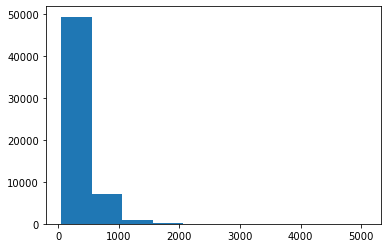

In [5]:
plt.hist(data['Gene length'])

(array([7124., 8572., 8454., 8500., 7513., 6252., 5141., 3867., 1514.,
         782.]),
 array([9.24358609e-06, 8.70611227e-02, 1.74113002e-01, 2.61164881e-01,
        3.48216760e-01, 4.35268639e-01, 5.22320518e-01, 6.09372398e-01,
        6.96424277e-01, 7.83476156e-01, 8.70528035e-01]),
 <a list of 10 Patch objects>)

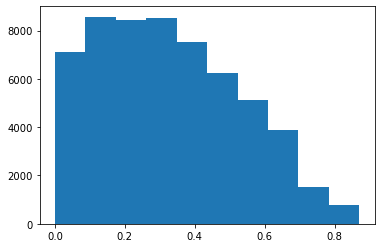

In [6]:
plt.hist(data['Distance to centromere'])

In [7]:
from sklearn.preprocessing import MinMaxScaler

data[['GC','Gene length', 'Number of exons']] = MinMaxScaler().fit_transform(data[['GC', 'Gene length', 'Number of exons']])

In [8]:
X, y = data.iloc[:,:-1],data.iloc[:,-1]

In [9]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [10]:
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 10, alpha = 10, n_estimators = 100)

In [11]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

In [12]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.8801108801108801


# SHAP testing

In [22]:
shap.initjs()

In [23]:
explainer = shap.TreeExplainer(xg_reg)
shap_values = explainer.shap_values(X)

In [24]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [25]:
shap.force_plot(explainer.expected_value, shap_values[1:1000,:], X.iloc[1:1000,:])

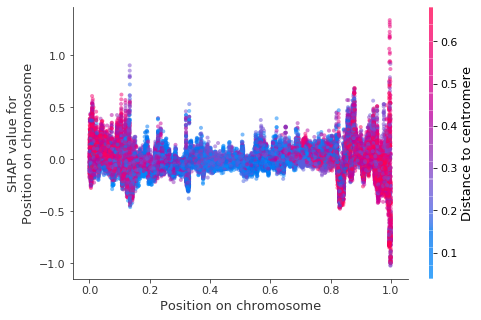

In [26]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False, interaction_index='Distance to centromere')


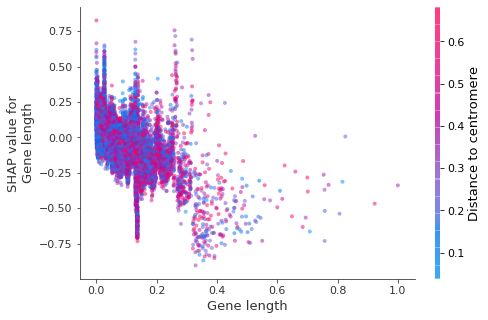

In [27]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False, interaction_index='Distance to centromere')

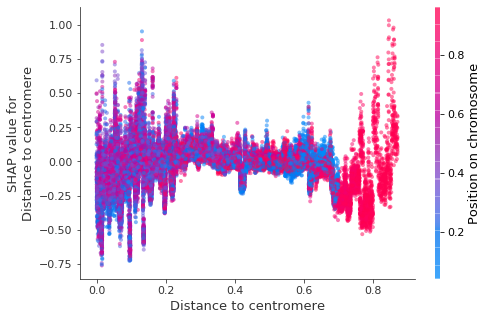

In [28]:
a = shap.dependence_plot("Distance to centromere", shap_values, X, alpha=0.5, show=False)

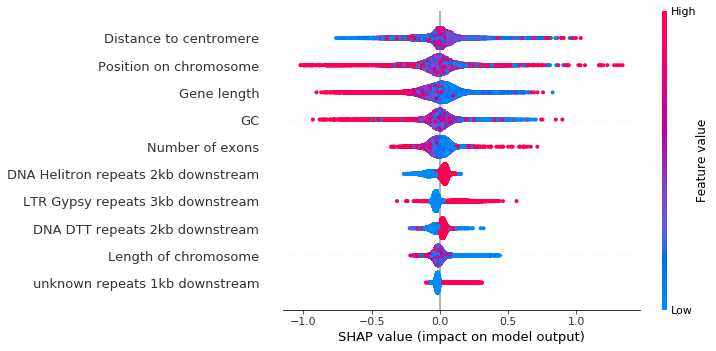

In [29]:
shap.summary_plot(shap_values, X, max_display = 10)

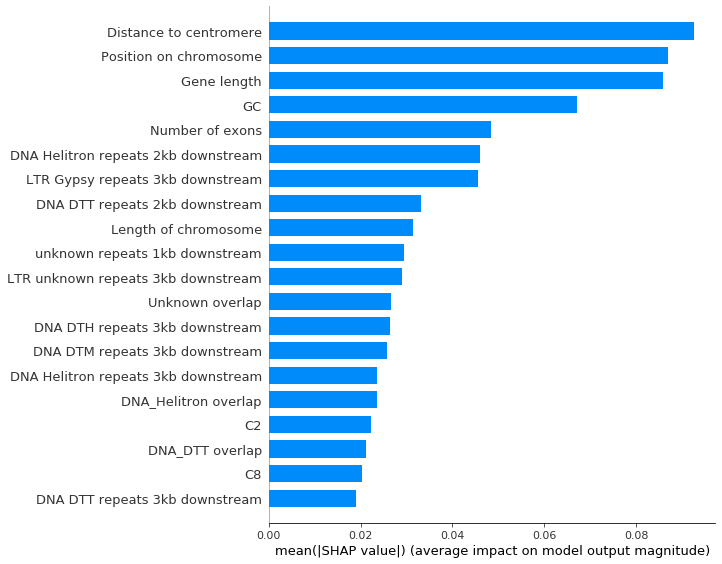

In [30]:
shap.summary_plot(shap_values, X, plot_type="bar")

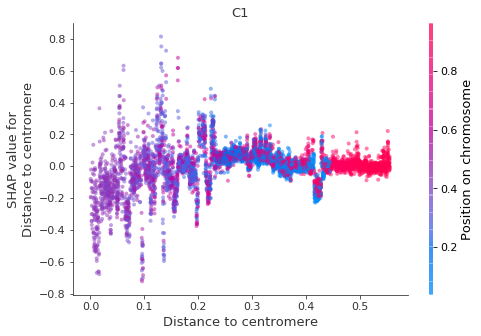

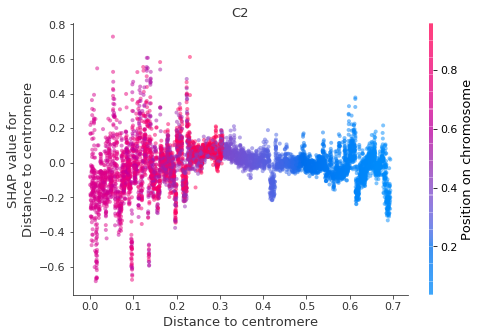

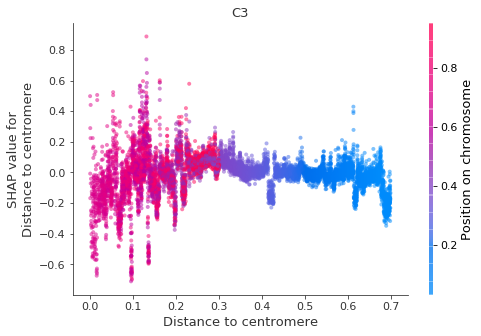

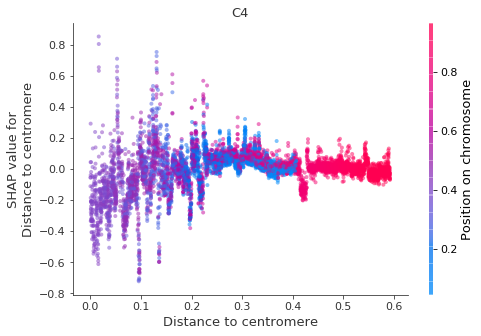

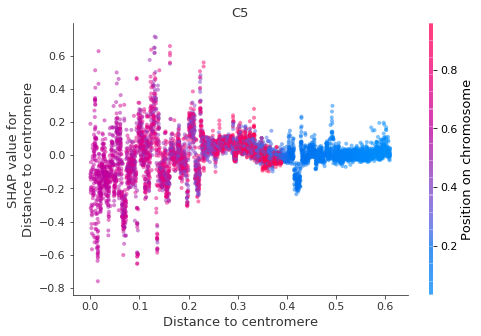

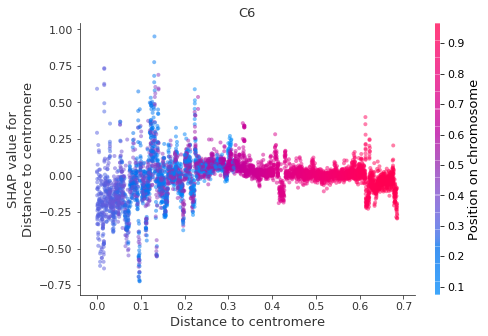

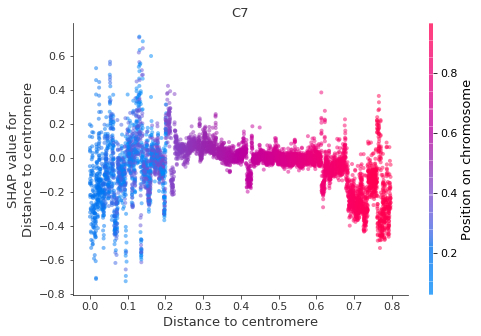

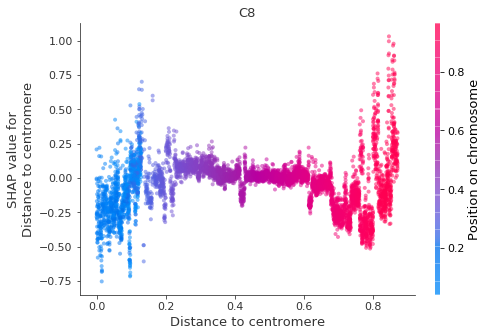

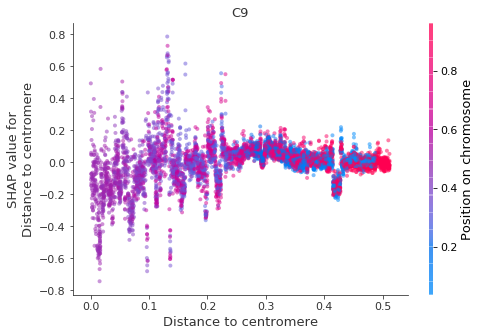

In [31]:
for chrom in ['C1', 'C2', 'C3', 'C4', 'C5','C6','C7','C8','C9']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = chrom)

In [32]:
print(plt.rcParams['figure.facecolor'])

white


## What's the model without any repeats?

In [33]:
data2 = data.copy()

In [34]:
data2.columns

Index(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'GC',
       ...
       'LTR Copia repeats 3kb downstream', 'LTR Gypsy repeats 3kb downstream',
       'LTR unknown repeats 3kb downstream', 'MITE DTA repeats 3kb downstream',
       'MITE DTC repeats 3kb downstream', 'MITE DTH repeats 3kb downstream',
       'MITE DTM repeats 3kb downstream', 'MITE DTT repeats 3kb downstream',
       'unknown repeats 3kb downstream', 'Variable'],
      dtype='object', length=130)

In [35]:
cols = [c for c in data2.columns if 'kb' not in c.lower() and 'overlap' not in c.lower() and c.lower() != 'gene_in_repeat']
data2 = data2[cols]

In [36]:
X2, y2 = data2.iloc[:,:-1],data2.iloc[:,-1]

In [37]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=123)

In [38]:
xg_reg2 = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 10, alpha = 10, n_estimators = 100)

In [39]:
xg_reg2.fit(X2_train,y2_train)

preds2 = xg_reg2.predict(X2_test)

In [40]:
accuracy = accuracy_score(y2_test, preds2)
print(accuracy)

0.8801108801108801



# K-fold of the 'everything' model

In [53]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

kfold = KFold(n_splits=10, random_state=7)
results = cross_val_score(xg_reg, X, y, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 88.00% (1.28%)


# Now calculate AUC and plot ROC

In [54]:
probs = xg_reg.predict_proba(X_test)
probs = probs[:, 1]
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)#fpr, tpr, thresholds = roc_curve(y, probs)
fpr, tpr, thresholds = roc_curve(y_test, probs)

AUC: 0.589


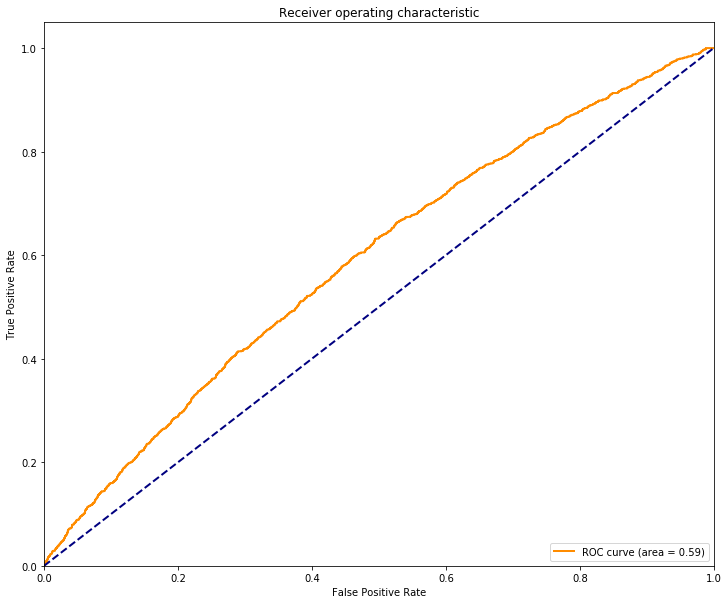

In [55]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Cover response

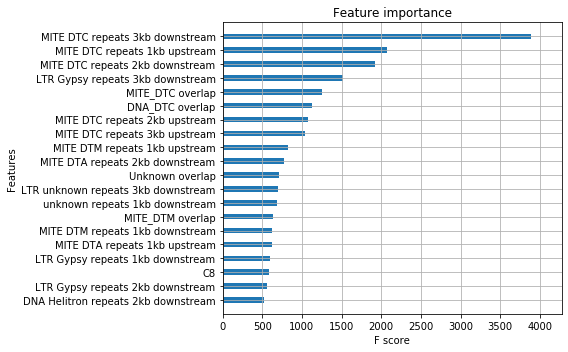

In [57]:
plt.rcParams['figure.figsize'] = (8, 5)

xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

plt.savefig('relative_gains.png')

# XGBoost optimisiation

In [13]:
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 50),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=42
    ),
    n_jobs = 3,
    n_iter = 10,   
    verbose = 0,
    refit = True,
    random_state = 42
)


In [14]:

def status_print(optim_result):
    """Status callback durring bayesian hyperparameter search"""
    
    # Get all the models tested so far in DataFrame format
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Get current parameters and the best parameters    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))
    
    # Save all model results
    clf_name = bayes_cv_tuner.estimator.__class__.__name__
    all_models.to_csv(clf_name+"_cv_results.csv")

In [15]:
result = bayes_cv_tuner.fit(X, y, callback=status_print)

Model #1
Best ROC-AUC: 0.5725
Best params: {'colsample_bylevel': 0.4160029192647807, 'colsample_bytree': 0.7304484857455519, 'gamma': 0.13031389926541354, 'learning_rate': 0.042815319280763466, 'max_delta_step': 13, 'max_depth': 21, 'min_child_weight': 2, 'n_estimators': 87, 'reg_alpha': 5.497557739289786e-07, 'reg_lambda': 0.05936070635912049, 'scale_pos_weight': 0.060830282487222144, 'subsample': 0.13556548021189216}

Model #2
Best ROC-AUC: 0.5904
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}

Model #3
Best ROC-AUC: 0.5904
Best params: {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 'gamma': 4.358684608480795e-07, '

In [10]:
params = {'colsample_bylevel': 0.8390144719977516, 'colsample_bytree': 0.8844821246070537, 
          'gamma': 4.358684608480795e-07, 'learning_rate': 0.7988179462781242, 'max_delta_step': 17, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 68, 'reg_alpha': 0.0005266983003701547, 'reg_lambda': 276.5424475574225, 'scale_pos_weight': 0.3016410771843142, 'subsample': 0.9923710598637134}
xg_reg = xgb.XGBClassifier(objective ='binary:logistic', eval_metric= 'auc', 
                           **params
)


In [11]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

In [12]:
accuracy = accuracy_score(y_test, preds)
print(accuracy)

0.8801975051975052


In [13]:
all_preds = xg_reg.predict(X)

In [14]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
# from https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def get_confusion_matrix(y_true, y_pred,
                          normalize=False):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

get_confusion_matrix(y, all_preds,  normalize=False)

Confusion matrix, without normalization
[[50794     0]
 [ 6925     0]]


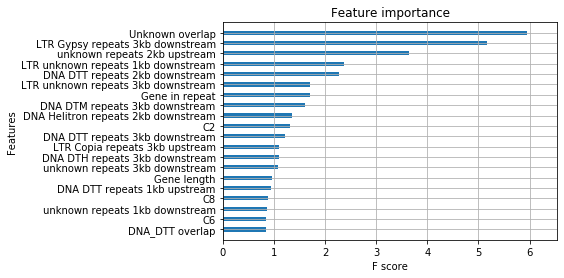

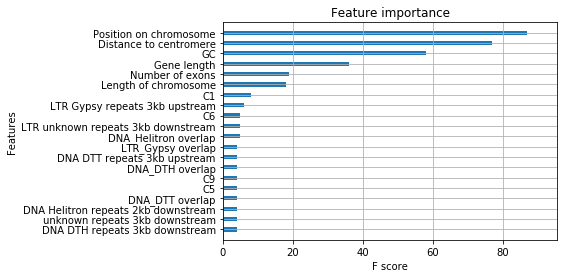

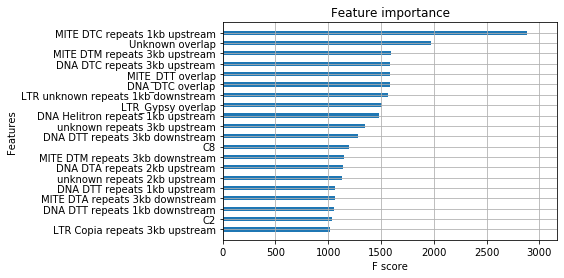

In [15]:
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
xgb.plot_importance(xg_reg, importance_type = 'weight', show_values = False, height=0.4, max_num_features = 20)
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)


In [16]:
explainer = shap.TreeExplainer(xg_reg)


In [17]:
shap_values = explainer.shap_values(X)

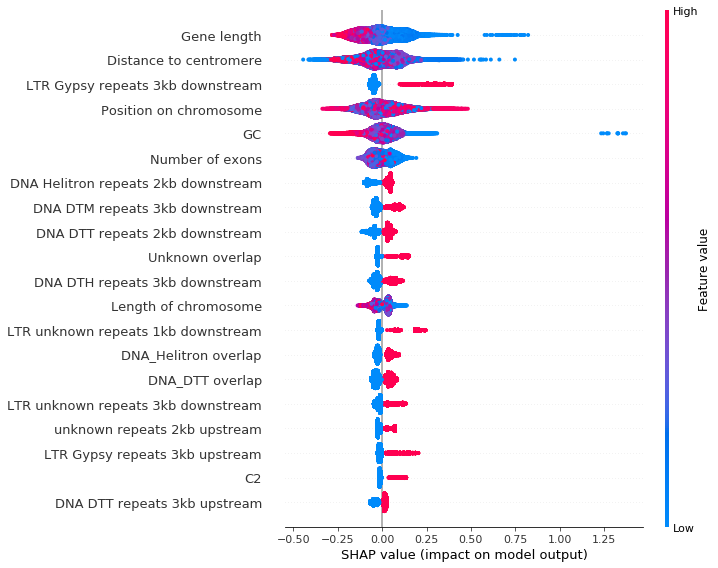

In [37]:
shap.summary_plot(shap_values, X, max_display = 20)

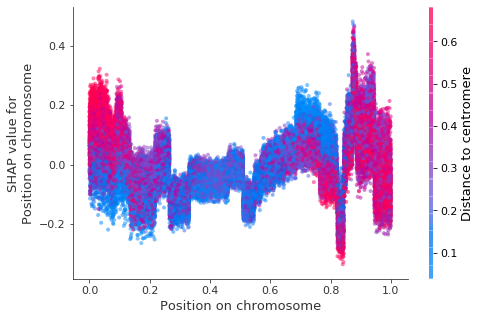

In [22]:
a = shap.dependence_plot("Position on chromosome", shap_values, X, alpha=0.5, show=False)
plt.savefig('Pos_chromosome.png')

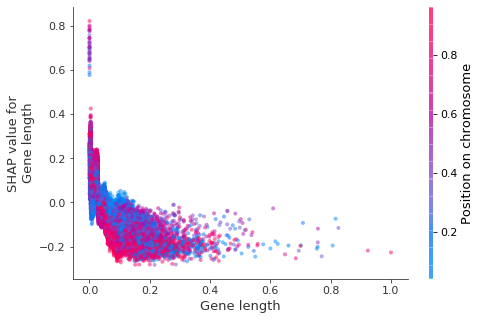

In [23]:
a = shap.dependence_plot("Gene length", shap_values, X, alpha=0.5, show=False)

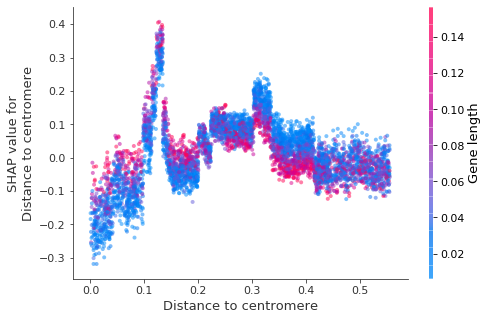

In [30]:
a = shap.dependence_plot("Distance to centromere", shap_values[X.C1==1], X[X.C1==1], alpha=0.5, show=False ,
                         interaction_index='auto')


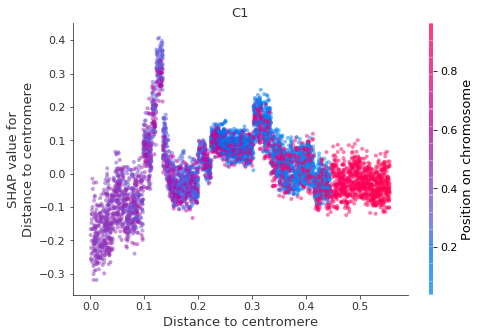

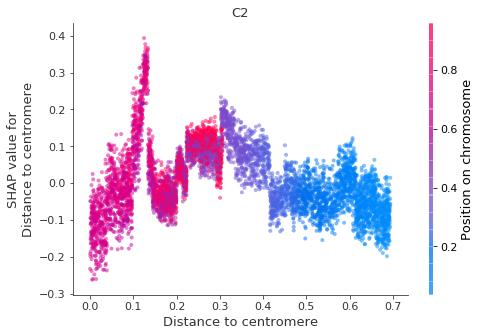

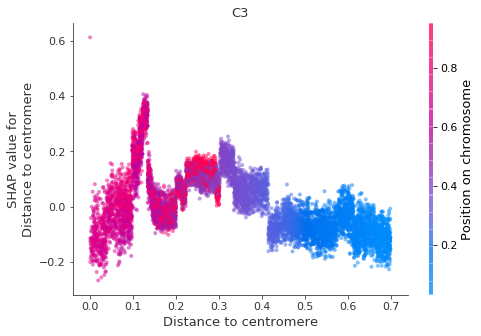

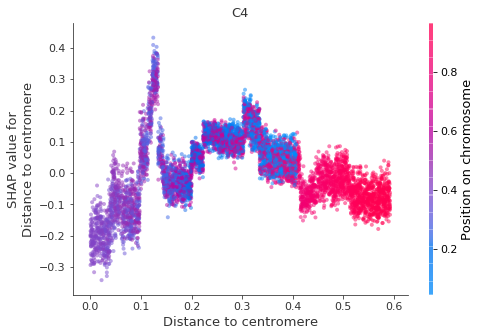

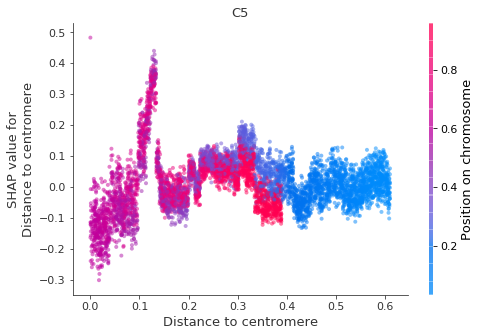

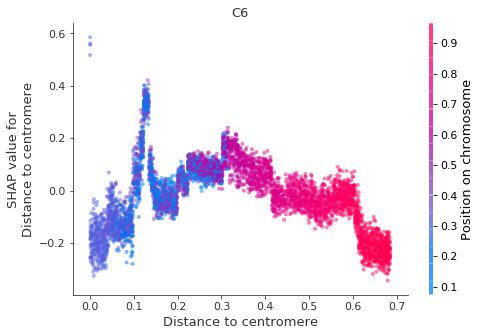

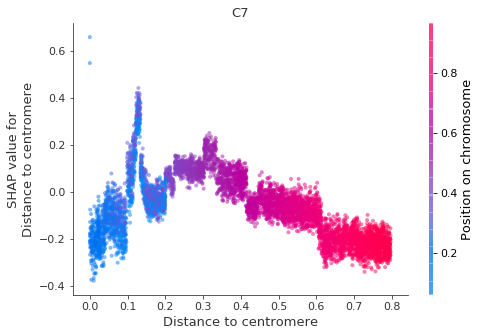

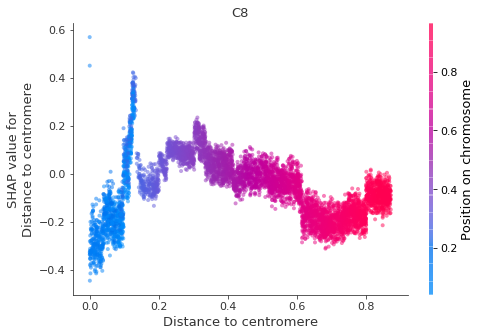

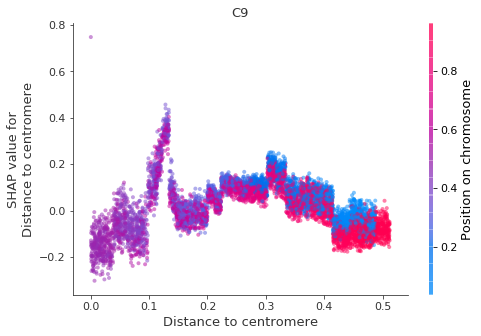

In [40]:
for chrom in ['C1', 'C2','C3','C4','C5','C6','C7','C8','C9']:
    a = shap.dependence_plot("Distance to centromere", shap_values[X[chrom]==1], X[X[chrom]==1], alpha=0.5,
                         interaction_index='Position on chromosome', title = chrom)

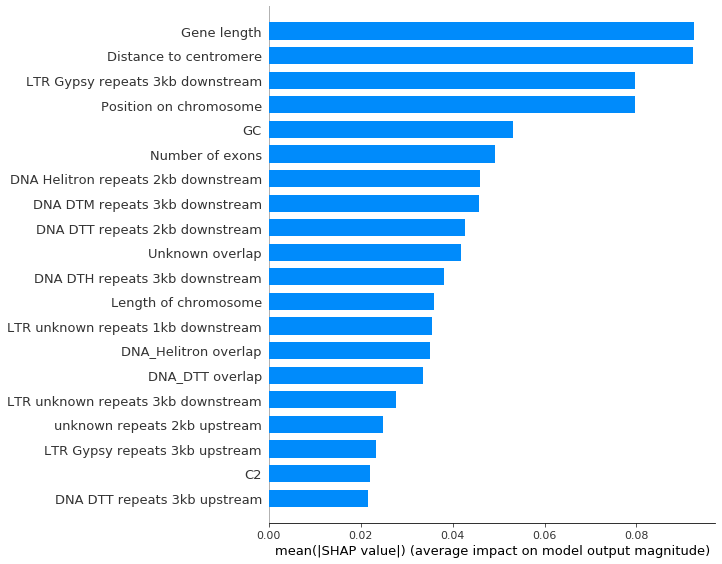

In [32]:
shap.summary_plot(shap_values, X, plot_type="bar")

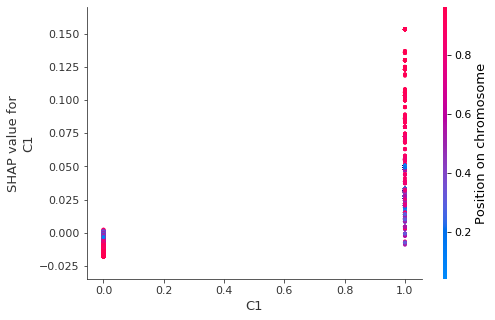

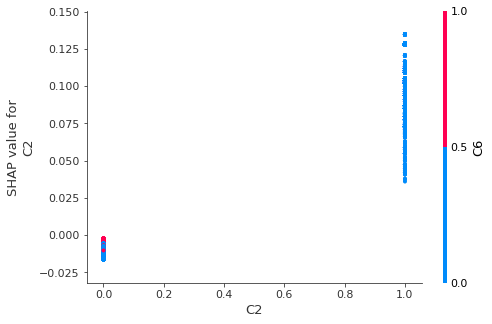

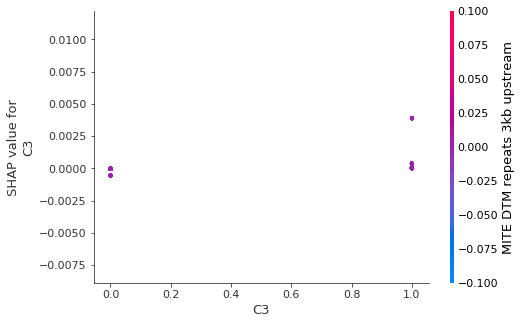

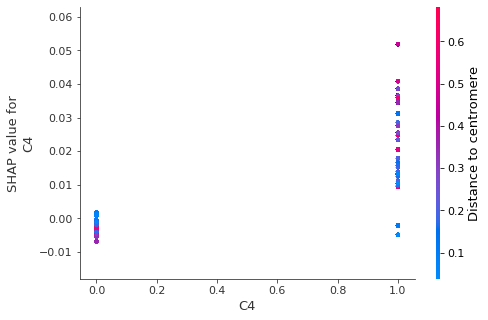

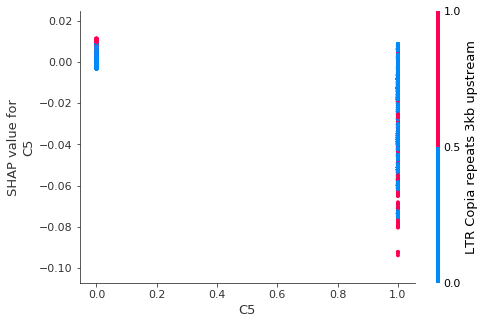

...

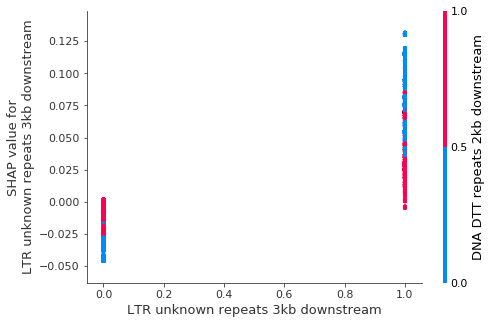

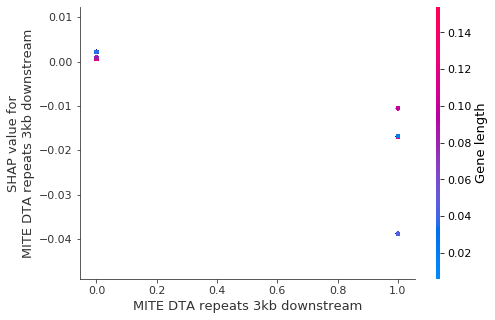

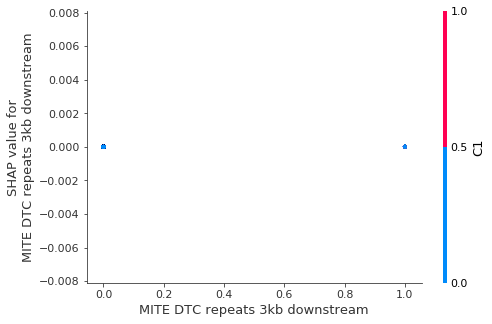

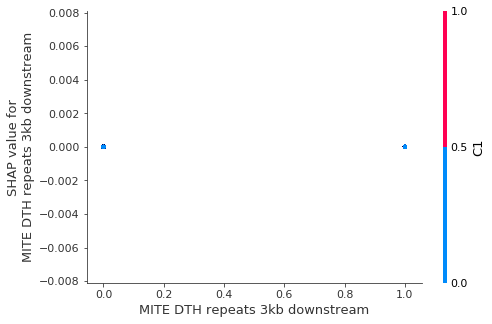

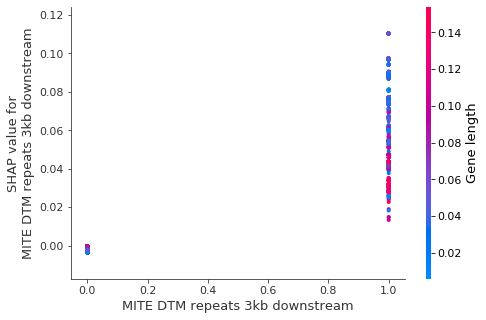

C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\00089503\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


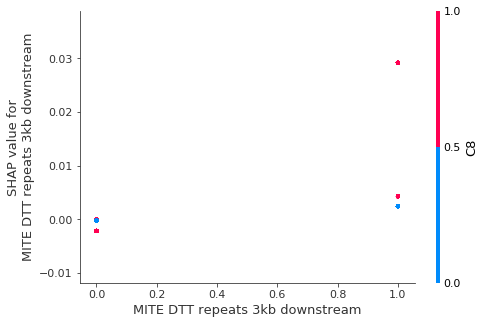

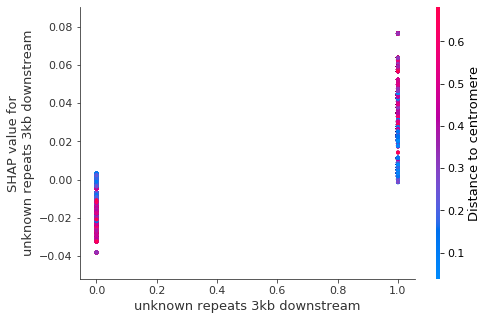

In [33]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X)

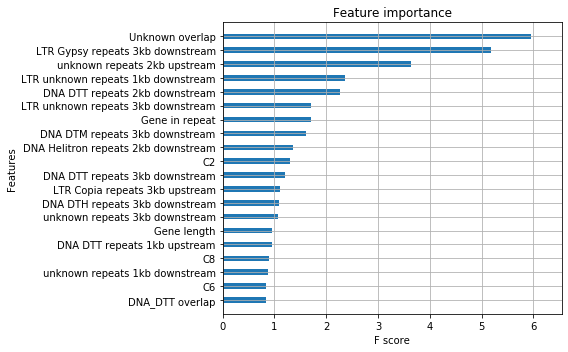

In [34]:
plt.rcParams['figure.figsize'] = (8, 5)
xgb.plot_importance(xg_reg, importance_type = 'gain', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()

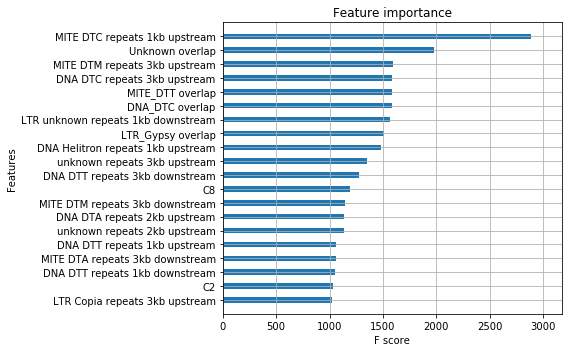

In [39]:
xgb.plot_importance(xg_reg, importance_type = 'cover', show_values = False, height=0.4, max_num_features = 20)
plt.tight_layout()